In [1]:
## Load modules
from pathlib import Path
import os
import random

# arrays
import numpy as np
import pandas as pd

# plotting
import matplotlib
import matplotlib.pyplot as plt
# Graphics in retina format are more sharp and legible
%config InlineBackend.figure_formats = {'png', 'retina'}
%matplotlib inline

# Load Alyssa's chaos labels data

In [2]:
chaos_area = pd.read_csv("OverallChaosTerrainInfo.txt", 
                         sep = ',',
                         names = ['Area (km^2)'],
                         usecols = [5],
                         skiprows = [0],
                         dtype = np.float64
                        )

# Name rows by chaos region
chaos_area.index = ['A','B','C','D','E',
                    'aa','bb','dd','ee',
                    'ff','gg','hh','ii',
                    'jj','kk','G','F','H',
                    'I','Co']

chaos_area.head()

,Area (km^2)
A,12255.299805
B,2761.270020
C,2936.820068
D,1953.699951
E,7665.509766


In [3]:
blocks_info = pd.read_csv("BlocksAttributeTable.txt", 
                          sep = ',',
                          names = ['Area', 'Type', 'Region'],
                          skiprows = [0],
                          usecols = [2,5,6]
                         )
blocks_info = blocks_info.astype({'Type': 'string', 'Region': 'string'})
blocks_info.head()

,Area,Type,Region
0,8.470227,Plate,Co
1,5.596594,Plate,Co
2,5.648979,Plate,Co
3,4.017123,Plate,Co
4,4.253416,Plate,Co


In [4]:
blocks_info.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2044 entries, 0 to 2043
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Area    2044 non-null   float64
 1   Type    2044 non-null   string 
 2   Region  2044 non-null   string 
dtypes: float64(1), string(2)
memory usage: 48.0 KB


In [5]:
plates = blocks_info[blocks_info["Type"] == "Plate"]
knobs = blocks_info[blocks_info["Type"] == "Knob"]

print("Num plates: ", plates["Region"].count())
print("Num knobs: ", knobs["Region"].count())

Num plates:  712
Num knobs:  1332


In [6]:
plates.sort_index

<bound method DataFrame.sort_index of            Area   Type Region
0      8.470227  Plate     Co
1      5.596594  Plate     Co
2      5.648979  Plate     Co
3      4.017123  Plate     Co
4      4.253416  Plate     Co
...         ...    ...    ...
2034  19.461984  Plate     gg
2035   8.855234  Plate     gg
2037  22.029404  Plate     gg
2038   9.882202  Plate     gg
2041   9.101017  Plate     gg

[712 rows x 3 columns]>

In [7]:
knobs.sort_index

<bound method DataFrame.sort_index of            Area  Type Region
39     4.381185  Knob     Co
56     4.561987  Knob     Co
96     5.531762  Knob     Co
99     6.301391  Knob     Co
137   11.035293  Knob     Co
...         ...   ...    ...
2036   7.076075  Knob     gg
2039   7.617203  Knob     gg
2040   4.451011  Knob     gg
2042   9.881818  Knob     gg
2043   4.638624  Knob     gg

[1332 rows x 3 columns]>

# Total Chaos Region Area

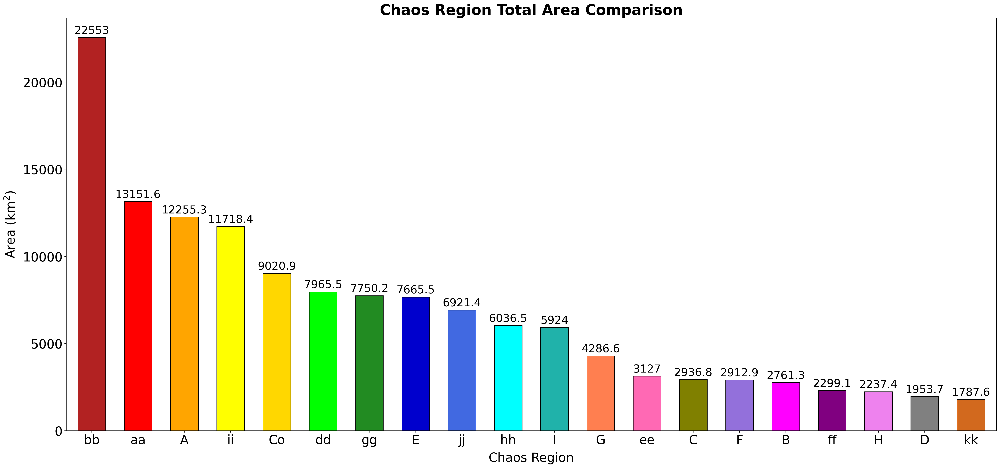

In [8]:
colors = ['firebrick', 'red', 'orange', 'yellow', 'gold',
          'lime', 'forestgreen', 'mediumblue', 'royalblue', 'cyan',
          'lightseagreen', 'coral', 'hotpink', 'olive', 'mediumpurple',
          'magenta', 'purple', 'violet', 'gray', 'chocolate']

ax = chaos_area['Area (km^2)'].apply(lambda x: np.round(x, 1)).sort_values(ascending=False).plot(kind='bar', 
                                    figsize = (26, 12),
                                    width=0.6, 
                                    edgecolor='black',
                                    color=colors)
# show values on top of bars
ax.bar_label(ax.containers[0], padding=3, fontsize=21)

# font size
plt.rcParams.update({'font.size': 24})

plt.tight_layout()
plt.legend().remove()
plt.xlabel("Chaos Region", labelpad=10, fontsize=24)
plt.xticks(rotation='horizontal', fontsize=24)
plt.yticks(fontsize=24)
plt.ylabel("Area ($\mathregular{km^{2}}$)", labelpad=10, fontsize=24)
plt.title("Chaos Region Total Area Comparison", fontweight = "bold", fontsize=28)
plt.savefig('plots/chaos_total_area.png', bbox_inches='tight', dpi=300)
plt.show()

# Size-Frequency Distribution Plots

## Ice Block Area Counts per Chaos Region

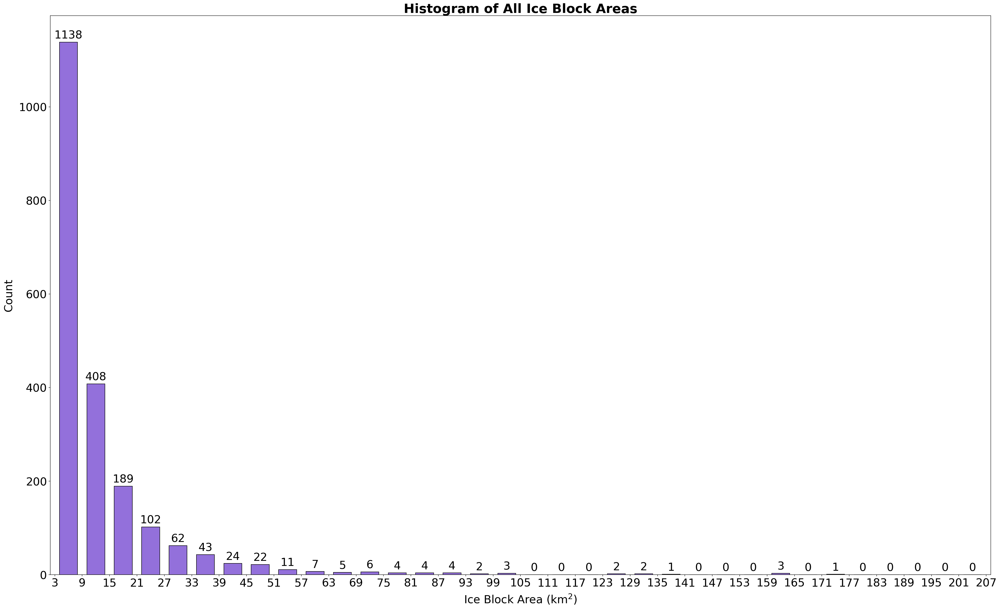

In [216]:
# all ice block area counts

fig = plt.figure(figsize=(30, 18))
nbins = np.arange(int(blocks_info['Area'].min()), int(blocks_info['Area'].max()), 6, dtype=int)
counts, edges, bars = plt.hist(blocks_info['Area'].apply(lambda x: np.round(x, 1)).sort_values(ascending=False), 
                               bins = nbins, 
                               range = (blocks_info['Area'].min(), blocks_info['Area'].max()),
                               edgecolor = "k", 
                               align = 'mid',
                               color = 'mediumpurple',
                               rwidth = 0.66)

# show values on top of bars
plt.bar_label(bars, padding=3)

# font size
plt.rcParams.update({'font.size': 24})

plt.tight_layout()
plt.xlabel("Ice Block Area ($\mathregular{km^{2}}$)", labelpad=10, fontsize=24)
plt.xticks(nbins, rotation='horizontal', fontsize=24)
plt.yticks(fontsize=24)
plt.ylabel("Count", labelpad=10, fontsize=24)
plt.xlim((2, int(blocks_info['Area'].max())))
plt.title("Histogram of All Ice Block Areas", fontweight = "bold", fontsize=28)
plt.savefig('plots/all_block_areas_hist.png', bbox_inches='tight', dpi=300)
plt.show()

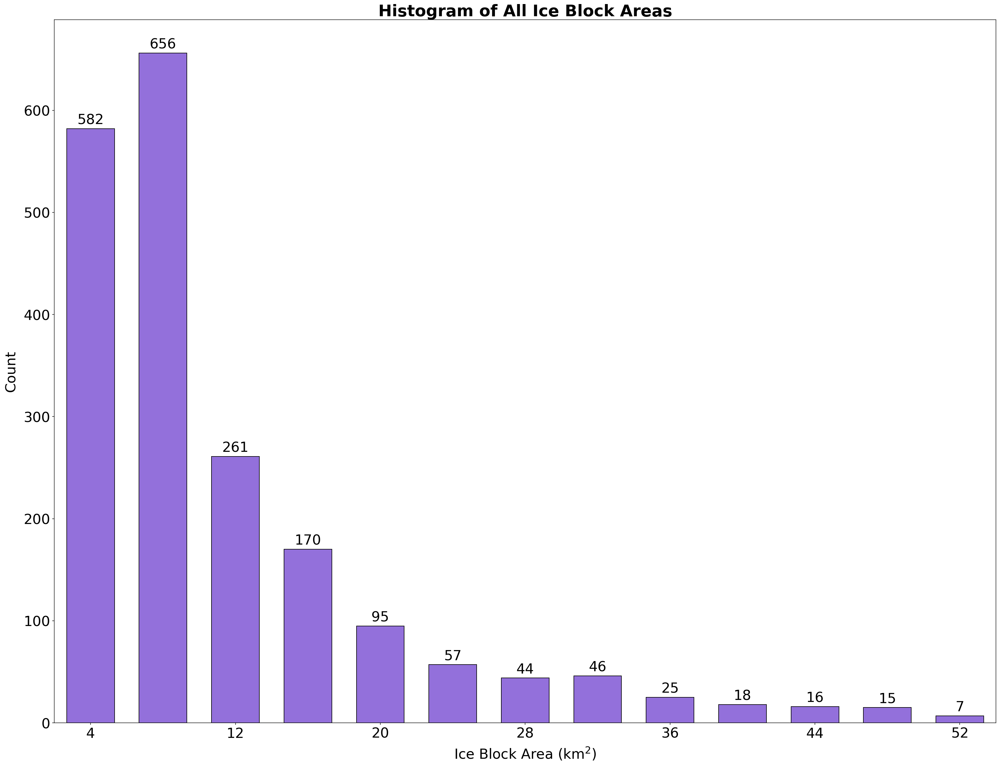

In [217]:
# all ice block area counts, cropped

fig = plt.figure(figsize=(24, 18))
nbins = np.arange(2, 103, 4, dtype=int)
counts, edges, bars = plt.hist(blocks_info['Area'].apply(lambda x: np.round(x, 1)).sort_values(ascending=False), 
                               bins = nbins, 
                               range = (blocks_info['Area'].min(), blocks_info['Area'].max()),
                               edgecolor = "k", 
                               align = 'mid',
                               color = 'mediumpurple',
                               rwidth = 0.66)

# show values on top of bars
plt.bar_label(bars, padding=3)

# font size
plt.rcParams.update({'font.size': 24})

plt.tight_layout()
plt.xlabel("Ice Block Area ($\mathregular{km^{2}}$)", labelpad=10, fontsize=24)
plt.xticks(nbins*2, rotation='horizontal', fontsize=24)
plt.yticks(fontsize=24)
plt.ylabel("Count", labelpad=10, fontsize=24)
plt.xlim(2, int(np.percentile(blocks_info['Area'], 97.5)))
plt.title("Histogram of All Ice Block Areas", fontweight = "bold", fontsize=28)
plt.savefig('plots/all_block_areas_hist_cropped.png', bbox_inches='tight', dpi=300)
plt.show()

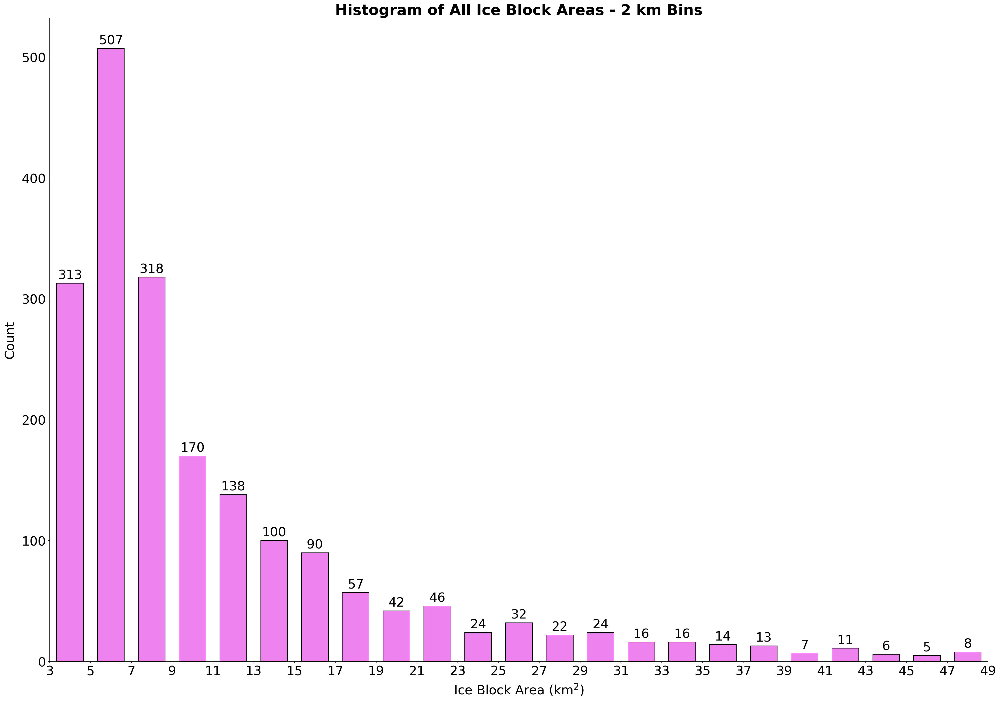

In [218]:
# all ice block area counts 2 km binning, cropped

fig = plt.figure(figsize=(26, 18))
nbins = np.arange(int(blocks_info['Area'].min()), int(blocks_info['Area'].max()), 2, dtype=int)
counts, edges, bars = plt.hist(blocks_info['Area'].apply(lambda x: np.round(x, 1)).sort_values(ascending=False), 
                               bins = nbins, 
                               range = (blocks_info['Area'].min(), blocks_info['Area'].max()),
                               edgecolor = "k", 
                               align = 'mid',
                               color = 'violet',
                               rwidth = 0.66)

# show values on top of bars
plt.bar_label(bars, padding=3)

# font size
plt.rcParams.update({'font.size': 24})

plt.tight_layout()
plt.xlabel("Ice Block Area ($\mathregular{km^{2}}$)", labelpad=10, fontsize=24)
plt.xticks(nbins, rotation='horizontal', fontsize=24)
plt.yticks(fontsize=24)
plt.ylabel("Count", labelpad=10, fontsize=24)
plt.xlim(int(blocks_info['Area'].min()), int(np.percentile(blocks_info['Area'], 97)))
plt.title("Histogram of All Ice Block Areas - 2 km Bins", fontweight = "bold", fontsize=28)
plt.savefig('plots/all_block_areas_2km_hist_cropped.png', bbox_inches='tight', dpi=300)
plt.show()

## Platy vs. Knobby Ice Block Area Total Counts

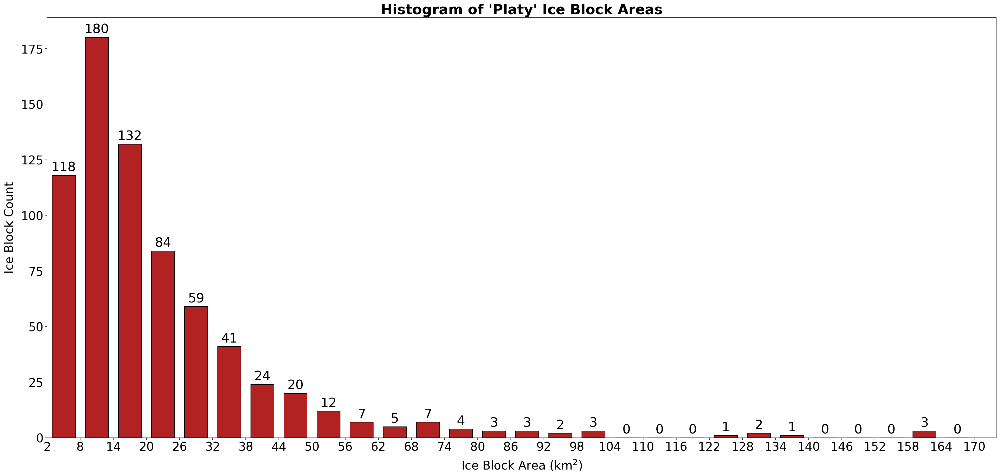

In [220]:
# Platy ice block area counts

fig = plt.figure(figsize=(26, 12))
nbins = np.arange(2, 174, 6, dtype=int)
counts, edges, bars = plt.hist(plates['Area'].apply(lambda x: np.round(x, 1)).sort_values(ascending=False), 
                               bins = nbins, 
                               range = (plates['Area'].min(), plates['Area'].max()),
                               edgecolor = "k", 
                               align = 'mid',
                               color = 'firebrick',
                               rwidth = 0.7)

# show values on top of bars
plt.bar_label(bars, padding=3)

plt.tight_layout()
plt.xlabel("Ice Block Area ($\mathregular{km^{2}}$)", labelpad=10, fontsize=22)
plt.xticks(nbins, rotation='horizontal', fontsize=22)
plt.yticks(fontsize=22)
plt.ylabel("Ice Block Count", labelpad=10, fontsize=22)
plt.xlim((2, 174))
plt.title("Histogram of 'Platy' Ice Block Areas", fontweight = "bold", fontsize=26)
plt.savefig('plots/ice_plates_hist.png', bbox_inches='tight', dpi=300)
plt.show()

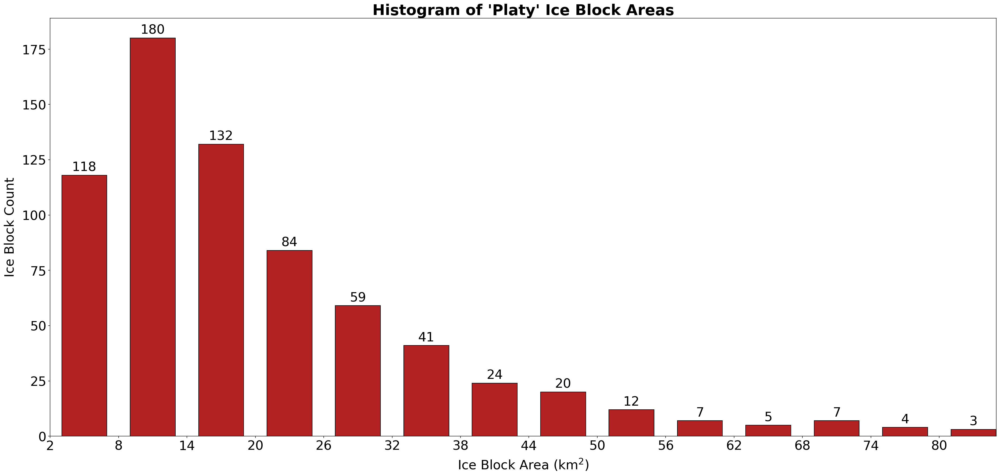

In [221]:
# Platy ice block area counts, cropped

fig = plt.figure(figsize=(26, 12))
nbins = np.arange(2, 104, 6, dtype=int)
counts, edges, bars = plt.hist(plates['Area'].apply(lambda x: np.round(x, 1)).sort_values(ascending=False), 
                               bins = nbins, 
                               range = (plates['Area'].min(), plates['Area'].max()),
                               edgecolor = "k", 
                               align = 'mid',
                               color = 'firebrick',
                               rwidth = 0.66)

# show values on top of bars
plt.bar_label(bars, padding=3)

plt.tight_layout()
plt.xlabel("Ice Block Area ($\mathregular{km^{2}}$)", labelpad=10, fontsize=24)
plt.xticks(nbins, rotation='horizontal', fontsize=24)
plt.yticks(fontsize=24)
plt.ylabel("Ice Block Count", labelpad=10, fontsize=24)
plt.xlim((2, int(np.percentile(plates['Area'], 97.8))))
plt.title("Histogram of 'Platy' Ice Block Areas", fontweight = "bold", fontsize=28)
plt.savefig('plots/ice_plates_hist_cropped.png', bbox_inches='tight', dpi=300)
plt.show()

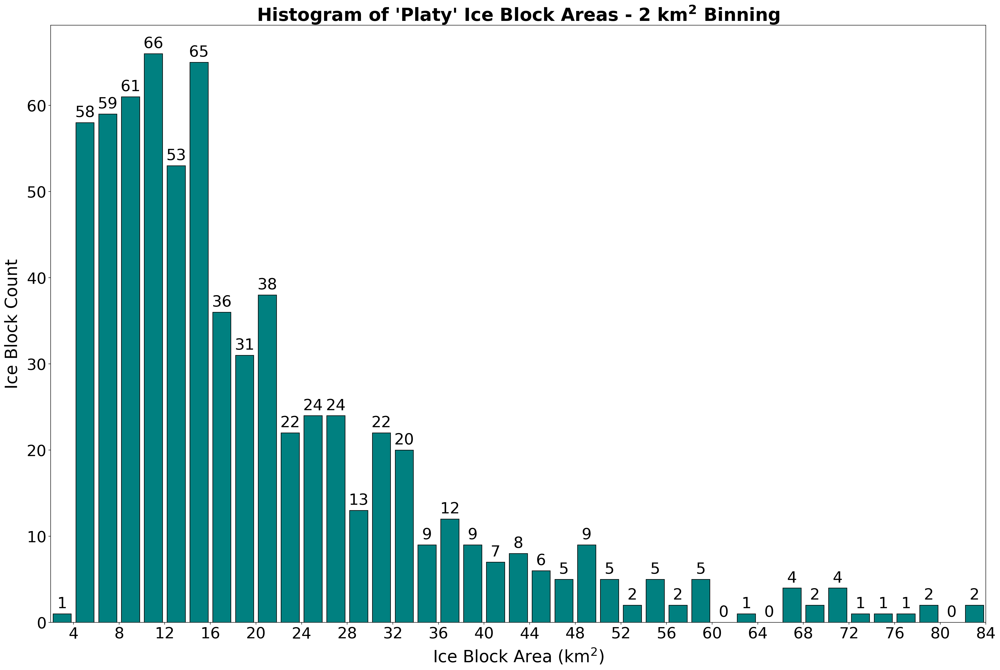

In [38]:
# Platy ice block area counts, cropped, 2 km binning

fig = plt.figure(figsize=(28, 18))
nbins = np.arange(2, int(np.percentile(plates['Area'], 97.8)), 2, dtype=int)
counts, edges, bars = plt.hist(plates['Area'].apply(lambda x: np.round(x, 1)).sort_values(ascending=False), 
                               bins = nbins, 
                               range = (plates['Area'].min(),  int(np.percentile(plates['Area'], 97.8))),
                               edgecolor = "k", 
                               color = 'teal',
                               rwidth = 0.8)

# show values on top of bars
plt.bar_label(bars, padding=4, fontsize=26)

plt.xlabel("Ice Block Area ($\mathregular{km^{2}}$)", labelpad=10, fontsize=28)
plt.xticks(nbins*2, rotation='horizontal', fontsize=26)
plt.yticks(fontsize=26)
plt.ylabel("Ice Block Count", labelpad=10, fontsize=28)
plt.xlim((2, 84))
plt.title("Histogram of 'Platy' Ice Block Areas - 2 $\mathregular{km^{2}}$ Binning", fontweight = "bold", fontsize=30)
plt.savefig('plots/ice_plates_hist_cropped_2km.png', bbox_inches='tight', dpi=300)
plt.show()

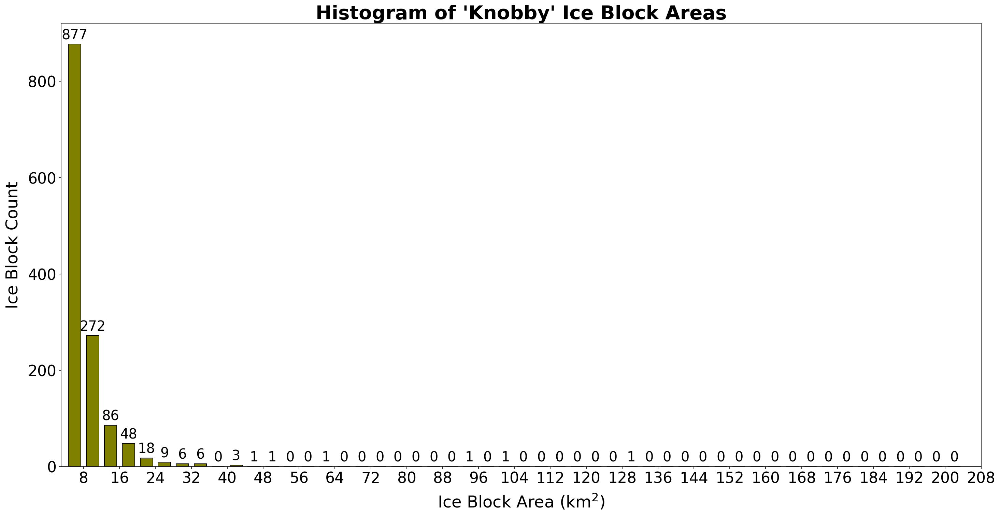

In [224]:
# Knobby ice block area counts

fig = plt.figure(figsize=(20, 10))
nbins = np.arange(4, int(knobs['Area'].max()), 4, dtype=int)
counts, edges, bars = plt.hist(knobs['Area'].apply(lambda x: np.round(x, 1)).sort_values(ascending=False), 
                                 bins=nbins, 
                                 range=(knobs['Area'].min(), knobs['Area'].max()),
                                 edgecolor="k", 
                                 align='mid',
                                 color='olive', 
                                 rwidth=0.7)

# show values on top of bars
plt.bar_label(bars, padding=3, fontsize=20)

# font size
plt.rcParams.update({'font.size': 20})

plt.tight_layout()
plt.xlabel("Ice Block Area ($\mathregular{km^{2}}$)", labelpad=10, fontsize=24)
plt.xticks(nbins*2, rotation='horizontal', fontsize=22)
plt.yticks(fontsize=22)
plt.ylabel("Ice Block Count", labelpad=10, fontsize=24)
plt.xlim(3, int(knobs['Area'].max()))
plt.title("Histogram of 'Knobby' Ice Block Areas", fontweight = "bold", fontsize=28)
plt.savefig('plots/ice_knobs_hist.png', bbox_inches='tight', dpi=300)
plt.show()

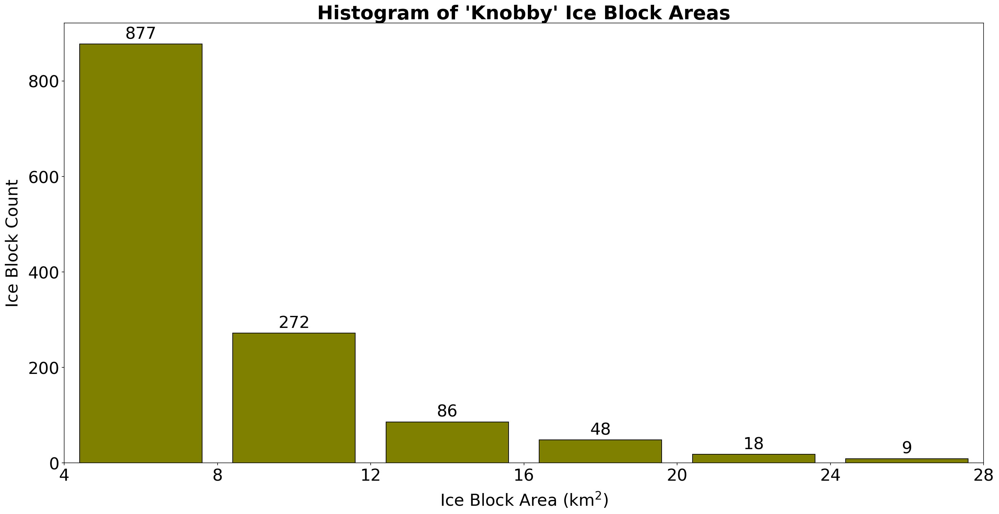

In [227]:
# Knobby ice block area counts, cropped

fig = plt.figure(figsize=(20, 10))
nbins = np.arange(4, int(knobs['Area'].max()), 4, dtype=int)
counts, edges, bars = plt.hist(knobs['Area'].apply(lambda x: np.round(x, 1)).sort_values(ascending=False), 
                                 bins=nbins, 
                                 range=(knobs['Area'].min(), knobs['Area'].max()),
                                 edgecolor="k", 
                                 align='mid',
                                 color='olive', 
                                 rwidth=0.8)

# show values on top of bars
plt.bar_label(bars, padding=3)

# font size
plt.rcParams.update({'font.size': 22})

plt.tight_layout()
plt.xlabel("Ice Block Area ($\mathregular{km^{2}}$)", labelpad=10, fontsize=24)
plt.xticks(nbins, rotation='horizontal', fontsize=24)
plt.ylabel("Ice Block Count", labelpad=10, fontsize=24)
plt.yticks(fontsize=24)
plt.xlim((4, int(np.percentile(knobs['Area'], 98.5))))
plt.title("Histogram of 'Knobby' Ice Block Areas", fontweight = "bold", fontsize=28)
plt.savefig('plots/ice_knobs_hist_cropped.png', bbox_inches='tight', dpi=300)
plt.show()

## Ice Block Area Counts per Chaos Region

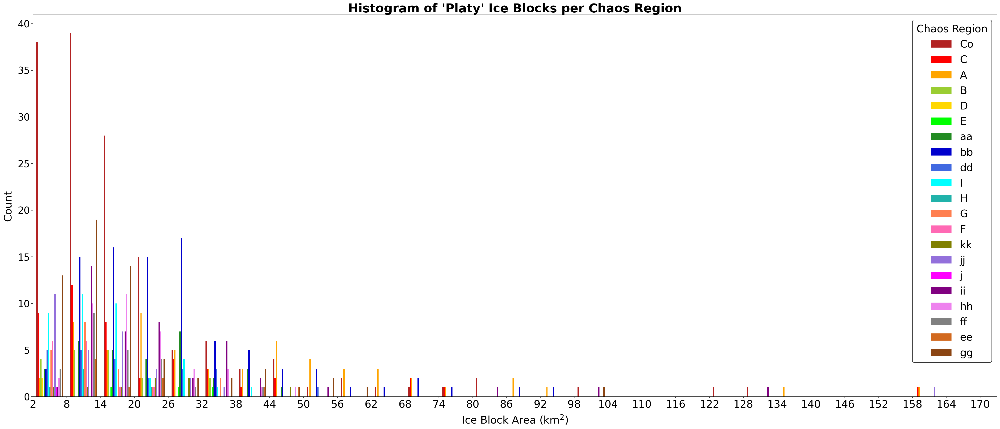

In [228]:
# Platy ice block area per chaos region
labels = ['A','B','C','D','E', 'aa','bb','dd','ee',
         'ff','gg','hh','ii', 'jj','kk','G','F','H', 'I','Co']

colors = ['firebrick', 'red', 'orange', 'yellowgreen', 'gold',
          'lime', 'forestgreen', 'mediumblue', 'royalblue', 'cyan',
          'lightseagreen', 'coral', 'hotpink', 'olive', 'mediumpurple',
          'magenta', 'purple', 'violet', 'gray', 'chocolate','saddlebrown']

fig = plt.figure(figsize=(32, 14))
nbins = np.arange(2, int(plates['Area'].max()), 6, dtype=int)
regions = plates['Region'].unique()
counts, edges, bars = plt.hist([plates.loc[plates['Region'] == i, 'Area'] for i in regions],
                               bins = nbins, 
                               #stacked = True,
                               range = (plates['Area'].min(), plates['Area'].max()),
                               align = 'mid',
                               label=regions,
                               color=colors,
                               rwidth = 0.8)

# font size
plt.rcParams.update({'font.size': 24})

# legend
plt.legend(loc='best', edgecolor='k', title="Chaos Region")

plt.tight_layout()
plt.xlabel("Ice Block Area ($\mathregular{km^{2}}$)", labelpad=10, fontsize=24)
plt.xticks(nbins, rotation='horizontal', fontsize=24)
plt.xlim((2, int(plates['Area'].max())))
plt.ylabel("Count", labelpad=10, fontsize=24)
plt.title("Histogram of 'Platy' Ice Blocks per Chaos Region", 
          fontweight = "bold", fontsize=28)
plt.savefig('plots/ice_plates_hist_per_chaos.png', bbox_inches='tight', dpi=300)
plt.show()

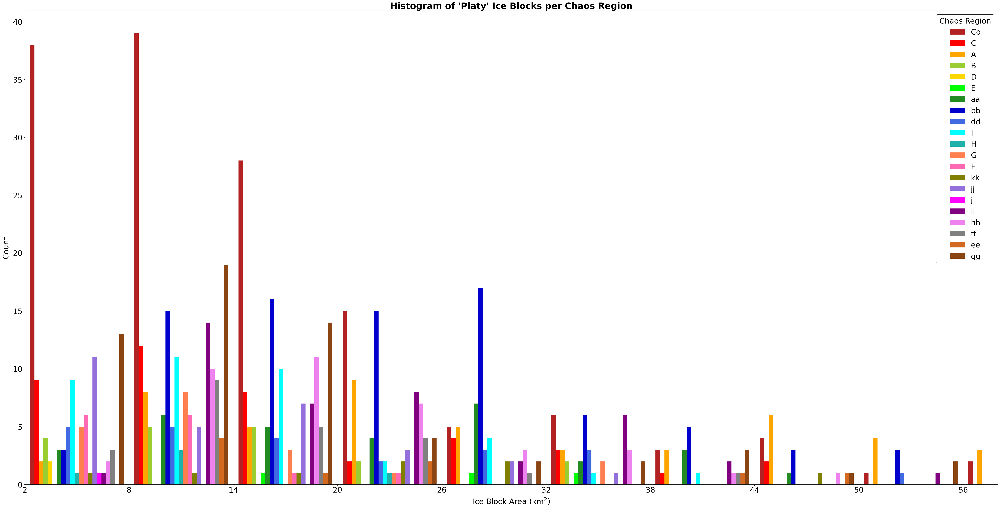

In [229]:
# Platy ice block area per chaos region, cropped
labels = ['A','B','C','D','E', 'aa','bb','dd','ee',
         'ff','gg','hh','ii', 'jj','kk','G','F','H', 'I','Co']

colors = ['firebrick', 'red', 'orange', 'yellowgreen', 'gold',
          'lime', 'forestgreen', 'mediumblue', 'royalblue', 'cyan',
          'lightseagreen', 'coral', 'hotpink', 'olive', 'mediumpurple',
          'magenta', 'purple', 'violet', 'gray', 'chocolate','saddlebrown']

fig = plt.figure(figsize=(44, 22))
nbins = np.arange(2, int(plates['Area'].max()), 6, dtype=int)
regions = plates['Region'].unique()
counts, edges, bars = plt.hist([plates.loc[plates['Region'] == i, 'Area'] for i in regions],
                               bins = nbins, 
                               #stacked = True,
                               range = (plates['Area'].min(), plates['Area'].max()),
                               align = 'mid',
                               label=regions,
                               color=colors,
                               rwidth = 0.9)

# font size
plt.rcParams.update({'font.size': 24})

# legend
plt.legend(loc='best', edgecolor='k', title="Chaos Region")

plt.tight_layout()
plt.xlabel("Ice Block Area ($\mathregular{km^{2}}$)", labelpad=10, fontsize=24)
plt.xticks(nbins, rotation='horizontal', fontsize=24)
plt.xlim(2, int(np.percentile(plates['Area'], 95)))
plt.ylabel("Count", labelpad=10, fontsize=24)
plt.yticks(fontsize=24)
plt.title("Histogram of 'Platy' Ice Blocks per Chaos Region", 
          fontweight = "bold", fontsize=28)
plt.savefig('plots/ice_plates_hist_per_chaos_cropped.png', bbox_inches='tight', dpi=300)
plt.show()

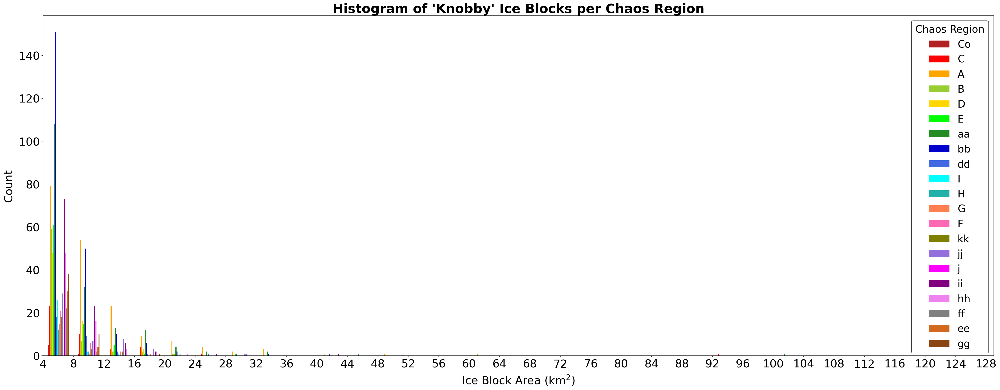

In [230]:
# Knobby ice block counts per chaos region

fig = plt.figure(figsize=(30, 12))
nbins = np.arange(4, 129, 4, dtype=int)
regions = plates['Region'].unique()
counts, edges, bars = plt.hist([knobs.loc[knobs['Region'] == i, 'Area'] for i in regions],
                               bins = nbins, 
                               #stacked = True,
                               range = (knobs['Area'].min(), knobs['Area'].max()),
                               align = 'mid',
                               label=regions,
                               color=colors,
                               rwidth = 0.7)

# font size
plt.rcParams.update({'font.size': 22})

# legend
plt.legend(loc='best', edgecolor='k', title="Chaos Region")

plt.tight_layout()
plt.xlabel("Ice Block Area ($\mathregular{km^{2}}$)", labelpad=10, fontsize=24)
plt.xticks(nbins, rotation='horizontal')
plt.xlim((4, 129))
plt.ylabel("Count", labelpad=10, fontsize=24)
plt.title("Histogram of 'Knobby' Ice Blocks per Chaos Region", 
          fontweight = "bold", fontsize=28)
plt.savefig('plots/ice_knobs_hist_per_chaos.png', bbox_inches='tight', dpi=300)
plt.show()


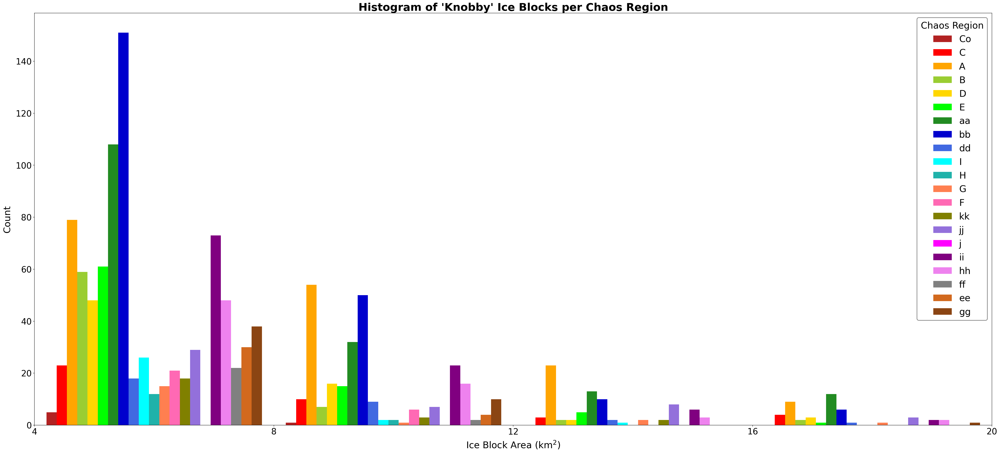

In [231]:
# Knobby ice block counts per chaos region, cropped

fig = plt.figure(figsize=(36, 16))
nbins = np.arange(4, int(knobs['Area'].max()), 4, dtype=int)
regions = plates['Region'].unique()
counts, edges, bars = plt.hist([knobs.loc[knobs['Region'] == i, 'Area'] for i in regions],
                               bins = nbins, 
                               #stacked = True,
                               range = (knobs['Area'].min(), knobs['Area'].max()),
                               align = 'mid',
                               label=regions,
                               color=colors,
                               rwidth = 0.9)

# font size
plt.rcParams.update({'font.size': 24})

# legend
plt.legend(loc='best', edgecolor='k', title="Chaos Region")

plt.tight_layout()
plt.xlabel("Ice Block Area ($\mathregular{km^{2}}$)", labelpad=10, fontsize=24)
plt.xticks(nbins, rotation='horizontal')
plt.xlim(4, int(np.percentile(knobs['Area'], 96.5)))
plt.ylabel("Count", labelpad=10, fontsize=24)
plt.title("Histogram of 'Knobby' Ice Blocks per Chaos Region", 
          fontweight = "bold", fontsize=28)
plt.savefig('plots/ice_knobs_hist_per_chaos_cropped.png', bbox_inches='tight', dpi=300)
plt.show()


### Leading Hemisphere

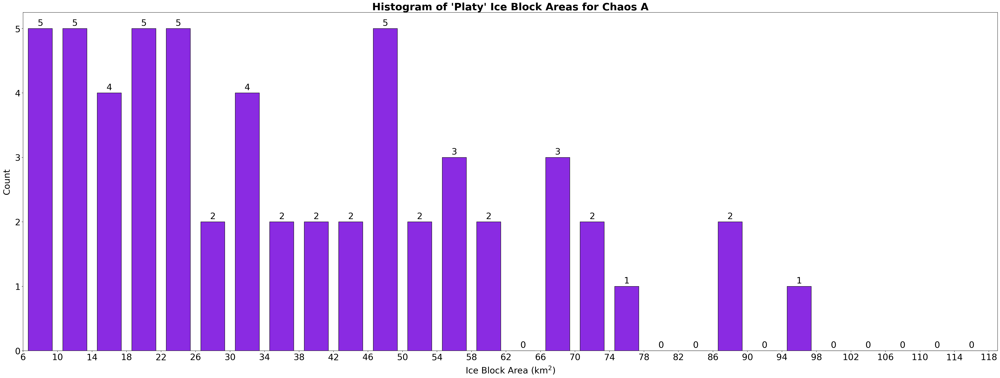

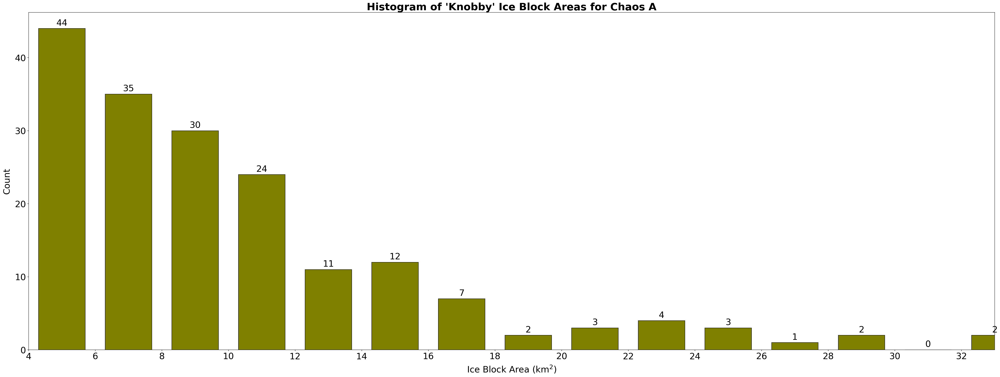

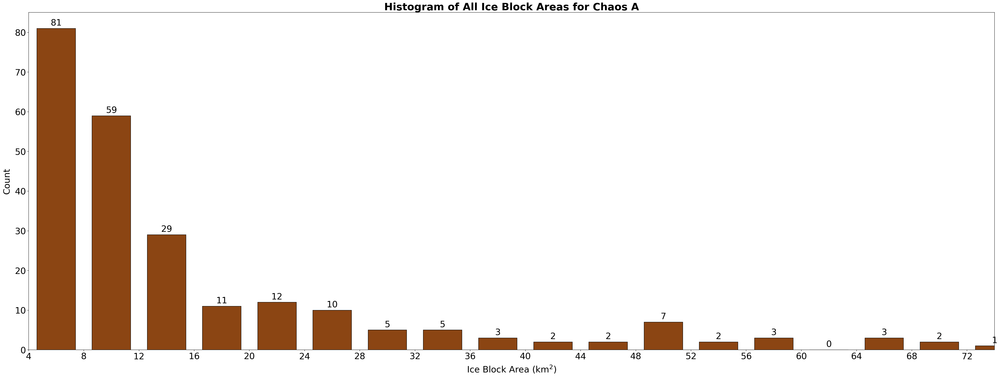

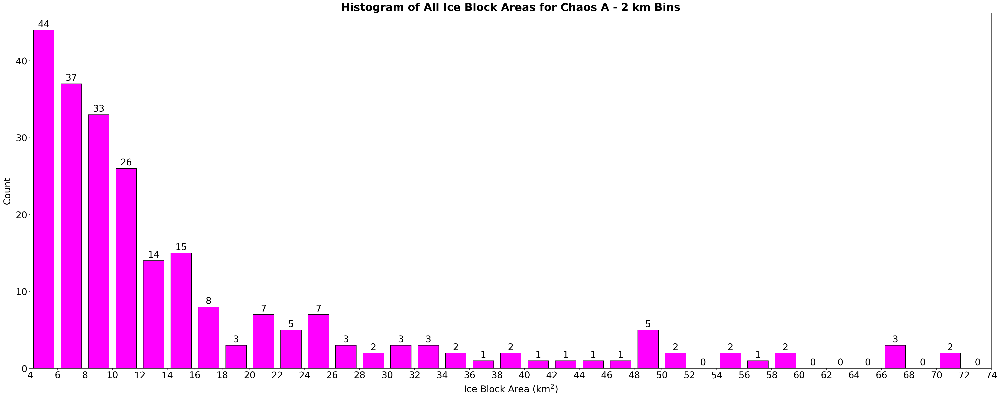

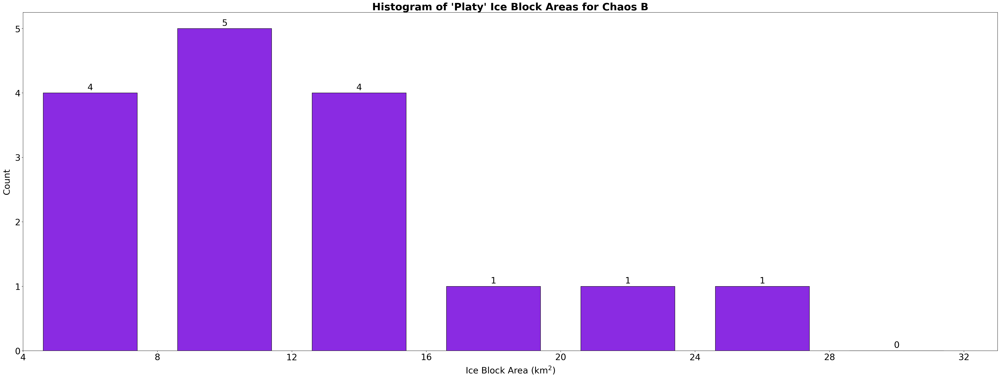

...

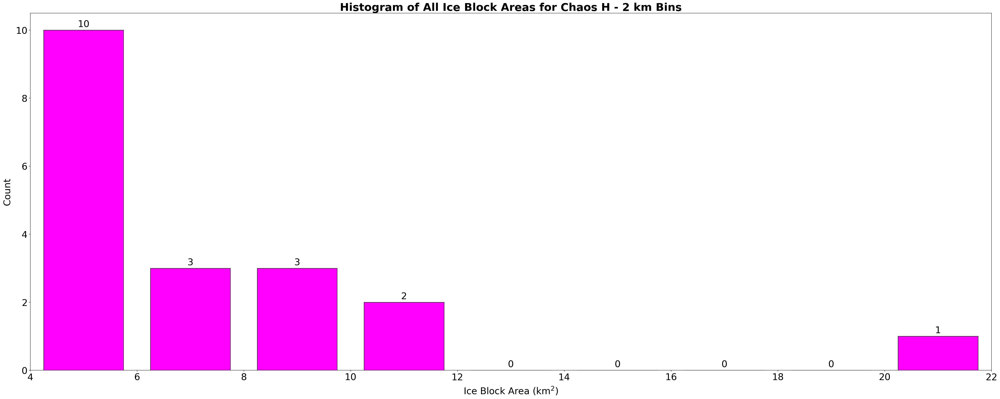

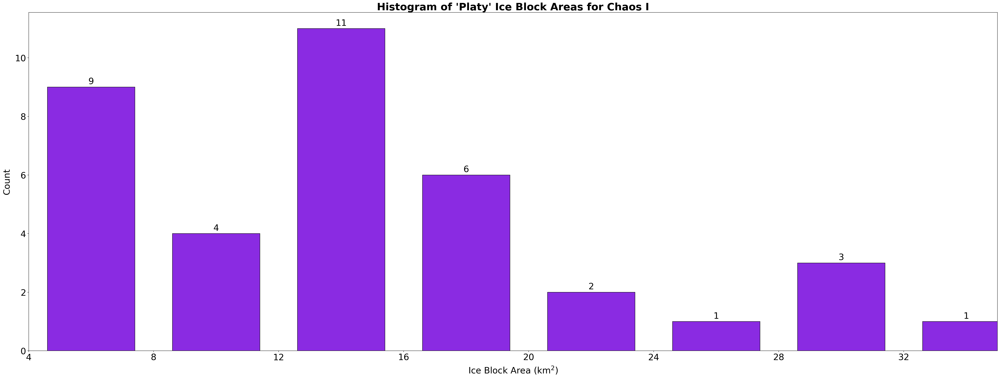

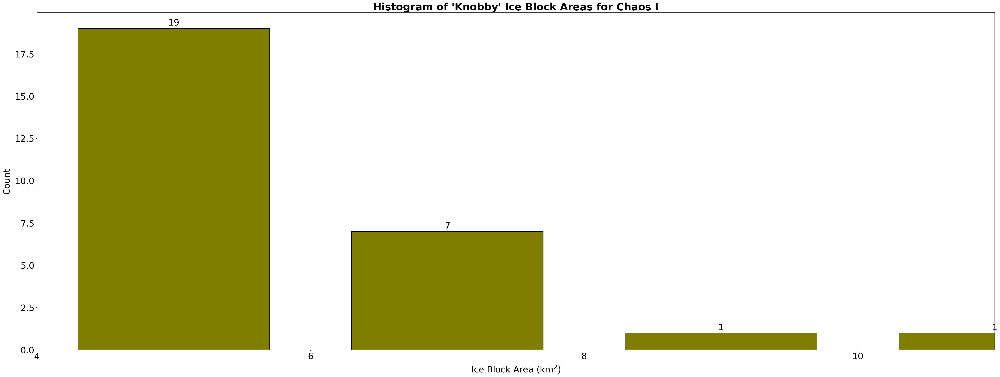

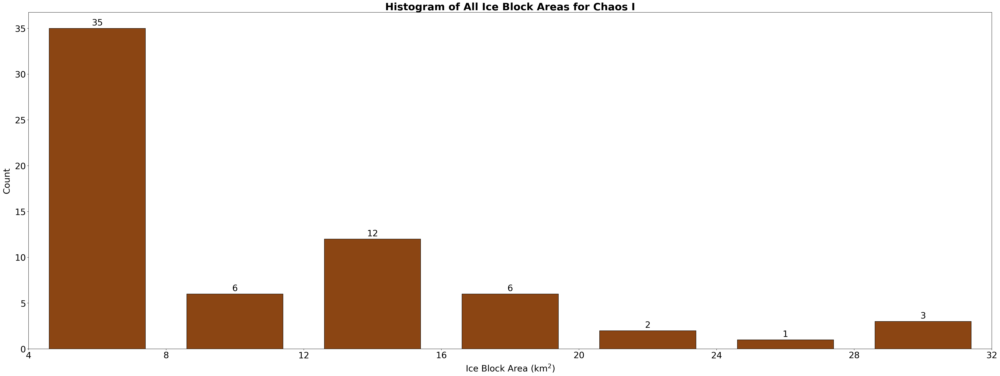

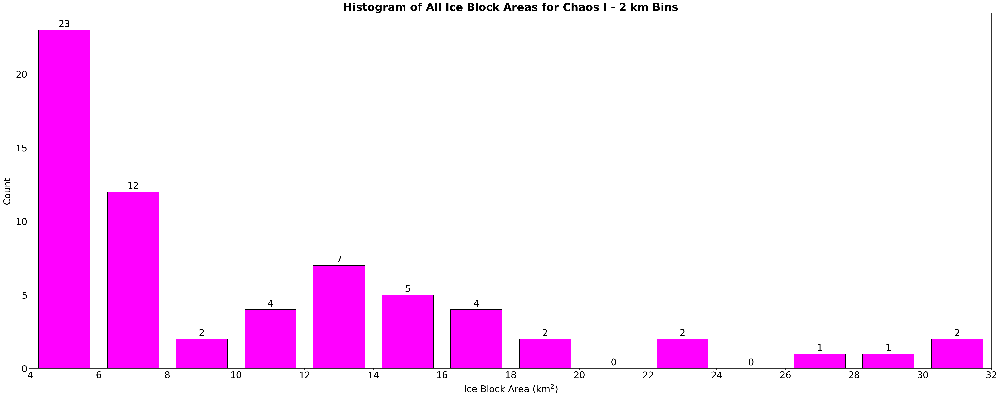

In [232]:
# block areas per chaos region, 97.5 percentiles
leading_chaos = ['A','B','C','D','E','G','F','H','I']

regions = blocks_info['Region'].unique()

for c in leading_chaos:
    ### plates
    fig = plt.figure(figsize=(38, 14))
    data = plates.loc[plates['Region'] == c, 'Area']
    nbins = np.arange(int(data.min()), int(data.max()), 4, dtype=int)
    counts, edges, bars = plt.hist(data,
                                 bins=nbins, 
                                 range=(data.min(), data.max()),
                                 edgecolor="k", 
                                 align='mid',
                                 color='blueviolet', 
                                 rwidth=0.7)

    # show values on top of bars
    plt.bar_label(bars, padding=3)

    plt.tight_layout()
    plt.xlabel("Ice Block Area ($\mathregular{km^{2}}$)", labelpad=10, fontsize=24)
    plt.xticks(nbins, rotation='horizontal', fontsize=24)
    plt.yticks(fontsize=24)
    plt.ylabel("Count", labelpad=10, fontsize=24)
    plt.xlim(int(data.min()), int(np.percentile(data, 97.5)))
    plt.title(f"Histogram of 'Platy' Ice Block Areas for Chaos {c}", 
              fontweight = "bold", fontsize=28)
    plt.savefig(f'plots/LH_plate_area_hist_chaos-{c}.png', bbox_inches='tight', dpi=300)
    plt.show()

    ###----------------------------------------------
    ### knobs
    fig = plt.figure(figsize=(38, 14))
    data = knobs.loc[knobs['Region'] == c, 'Area']
    nbins = np.arange(int(data.min()), int(data.max()), 2, dtype=int)
    counts, edges, bars = plt.hist(data,
                                 bins=nbins, 
                                 range=(data.min(), data.max()),
                                 edgecolor="k", 
                                 align='mid',
                                 color='olive', 
                                 rwidth=0.7)

    # show values on top of bars
    plt.bar_label(bars, padding=3)

    plt.tight_layout()
    plt.xlabel("Ice Block Area ($\mathregular{km^{2}}$)", labelpad=10, fontsize=24)
    plt.xticks(nbins, rotation='horizontal', fontsize=24)
    plt.yticks(fontsize=24)
    plt.ylabel("Count", labelpad=10, fontsize=24)
    plt.xlim(int(data.min()), int(np.percentile(data, 97.5)))
    plt.title(f"Histogram of 'Knobby' Ice Block Areas for Chaos {c}", 
              fontweight = "bold", fontsize=28)
    plt.savefig(f'plots/LH_knob_area_hist_chaos-{c}.png', bbox_inches='tight', dpi=300)
    plt.show()
    
    ###----------------------------------------------
    ### all blocks
    fig = plt.figure(figsize=(38, 14))
    data = blocks_info.loc[blocks_info['Region'] == c, 'Area']
    nbins = np.arange(int(data.min()), int(data.max()), 4, dtype=int)
    counts, edges, bars = plt.hist(data,
                                 bins=nbins, 
                                 range=(data.min(), data.max()),
                                 edgecolor="k", 
                                 align='mid',
                                 color='saddlebrown', 
                                 rwidth=0.7)

    # show values on top of bars
    plt.bar_label(bars, padding=3)

    plt.tight_layout()
    plt.xlabel("Ice Block Area ($\mathregular{km^{2}}$)", labelpad=10, fontsize=24)
    plt.xticks(nbins, rotation='horizontal', fontsize=24)
    plt.yticks(fontsize=24)
    plt.ylabel("Count", labelpad=10, fontsize=24)
    plt.xlim(int(data.min()), int(np.percentile(data, 97.5)))
    plt.title(f"Histogram of All Ice Block Areas for Chaos {c}", 
              fontweight = "bold", fontsize=28)
    plt.savefig(f'plots/LH_all_block_area_hist_chaos-{c}.png', bbox_inches='tight', dpi=300)
    plt.show()
    
    ###----------------------------------------------
    ### all blocks, 2 km binning, cropped
    fig = plt.figure(figsize=(36, 14))
    data = blocks_info.loc[blocks_info['Region'] == c, 'Area']
    nbins = np.arange(int(data.min()), int(data.max()), 2, dtype=int)
    counts, edges, bars = plt.hist(data,
                                 bins=nbins, 
                                 range=(data.min(), data.max()),
                                 edgecolor="k", 
                                 align='mid',
                                 color='magenta', 
                                 rwidth=0.75)

    # show values on top of bars
    plt.bar_label(bars, padding=3)

    plt.tight_layout()
    plt.xlabel("Ice Block Area ($\mathregular{km^{2}}$)", labelpad=10, fontsize=24)
    plt.xticks(nbins, rotation='horizontal', fontsize=24)
    plt.yticks(fontsize=24)
    plt.ylabel("Count", labelpad=10, fontsize=24)
    plt.xlim(int(data.min()), int(np.percentile(data, 97.5)))
    plt.title(f"Histogram of All Ice Block Areas for Chaos {c} - 2 km Bins", 
              fontweight = "bold", fontsize=28)
    plt.savefig(f'plots/LH_all_block_area_2km_hist_chaos-{c}_cropped.png', bbox_inches='tight', dpi=300)
    plt.show()

### Trailing Hemisphere

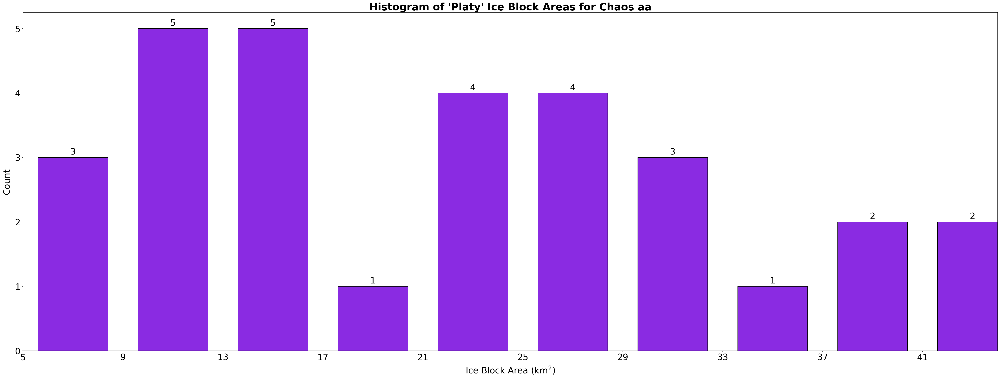

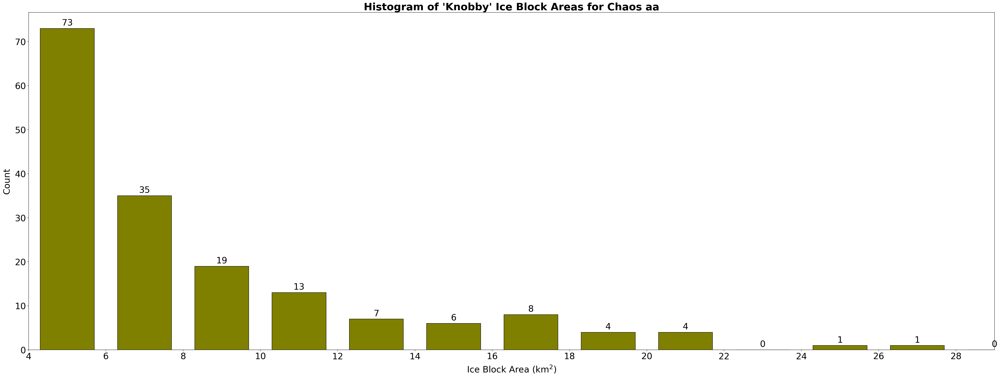

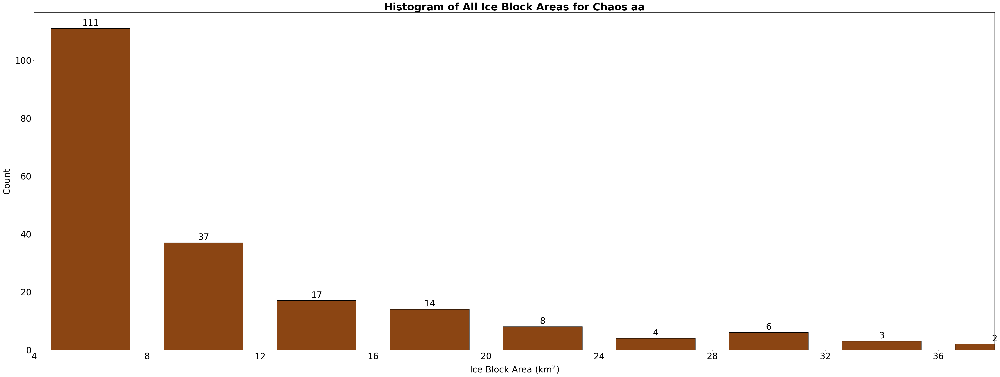

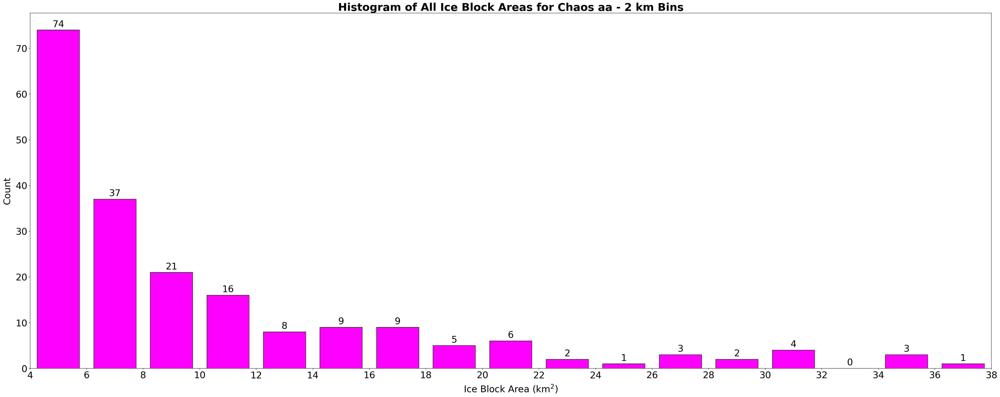

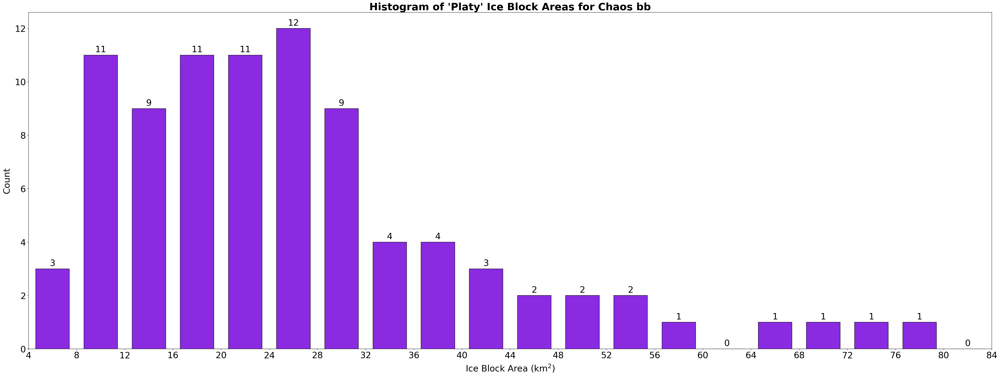

...

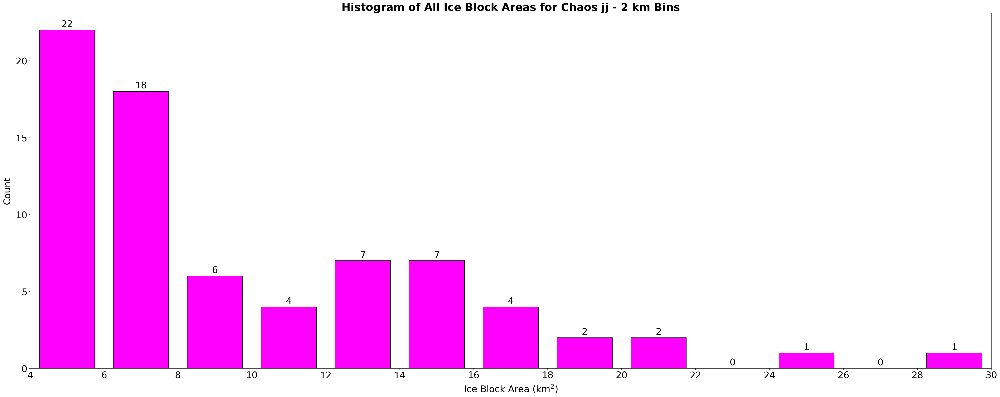

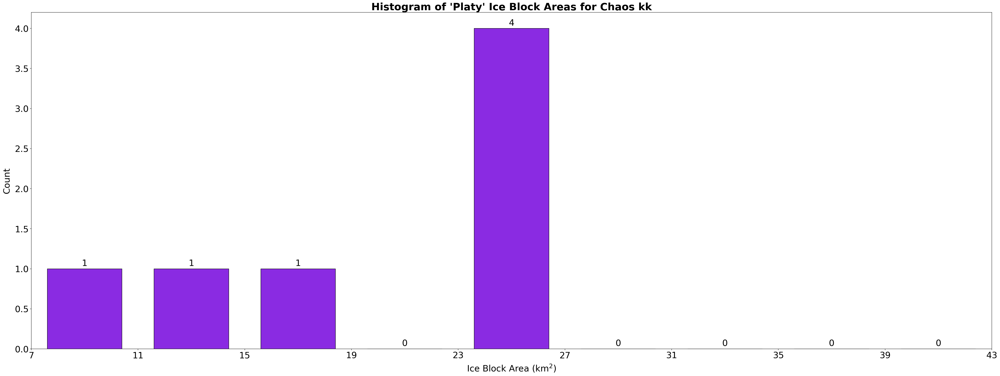

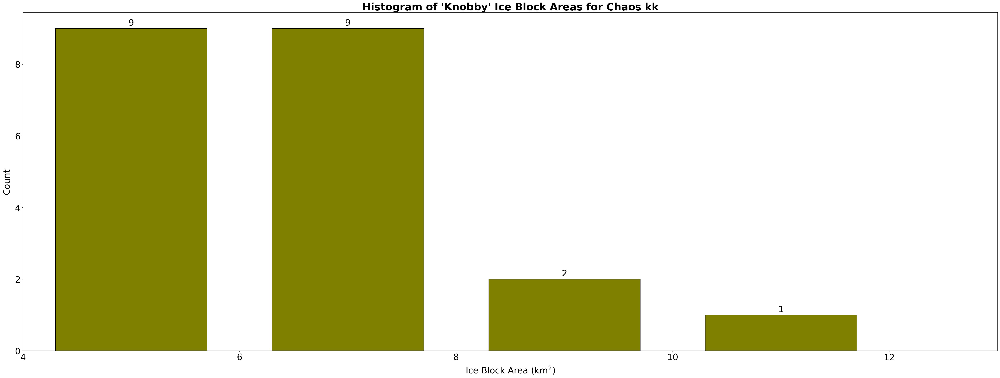

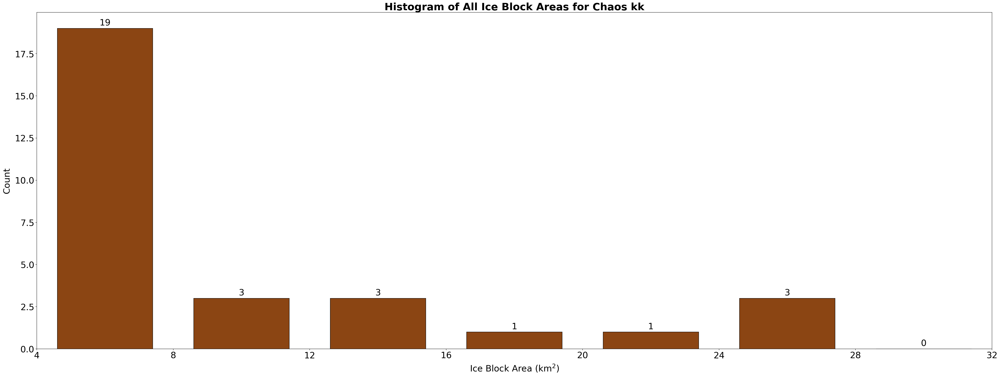

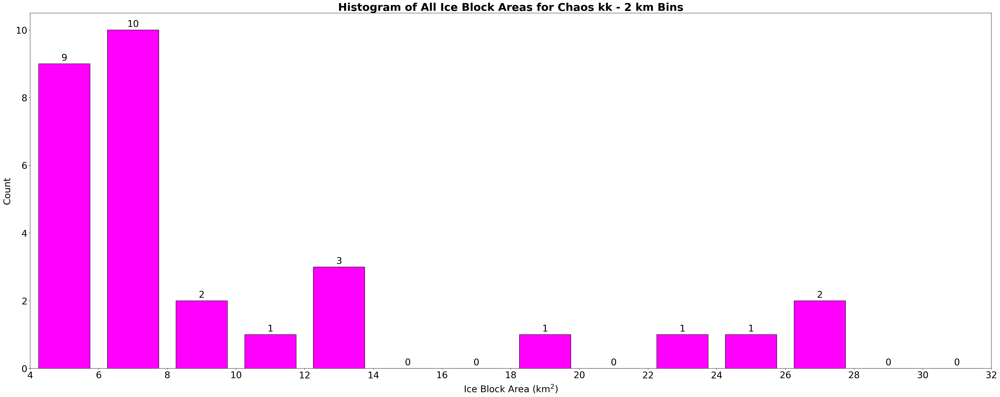

In [233]:
trailing_chaos = ['aa','bb','Co','dd','ee','ff',
                  'gg','hh','ii', 'jj','kk']

for c in trailing_chaos:
    ### plates
    fig = plt.figure(figsize=(38, 14))
    data = plates.loc[plates['Region'] == c, 'Area']
    nbins = np.arange(int(data.min()), int(data.max()), 4, dtype=int)
    counts, edges, bars = plt.hist(data,
                                 bins=nbins, 
                                 range=(data.min(), data.max()),
                                 edgecolor="k", 
                                 align='mid',
                                 color='blueviolet', 
                                 rwidth=0.7)

    # show values on top of bars
    plt.bar_label(bars, padding=3)

    plt.tight_layout()
    plt.xlabel("Ice Block Area ($\mathregular{km^{2}}$)", labelpad=10, fontsize=24)
    plt.xticks(nbins, rotation='horizontal', fontsize=24)
    plt.yticks(fontsize=24)
    plt.ylabel("Count", labelpad=10, fontsize=24)
    plt.xlim(int(data.min()), int(np.percentile(data, 97.5)))
    plt.title(f"Histogram of 'Platy' Ice Block Areas for Chaos {c}", 
              fontweight = "bold", fontsize=28)
    plt.savefig(f'plots/TH_plate_area_hist_chaos-{c}.png', bbox_inches='tight', dpi=300)
    plt.show()

    ###----------------------------------------------
    ### knobs
    fig = plt.figure(figsize=(38, 14))
    data = knobs.loc[knobs['Region'] == c, 'Area']
    nbins = np.arange(int(data.min()), int(data.max()), 2, dtype=int)
    counts, edges, bars = plt.hist(data,
                                 bins=nbins, 
                                 range=(data.min(), data.max()),
                                 edgecolor="k", 
                                 align='mid',
                                 color='olive', 
                                 rwidth=0.7)

    # show values on top of bars
    plt.bar_label(bars, padding=3)

    plt.tight_layout()
    plt.xlabel("Ice Block Area ($\mathregular{km^{2}}$)", labelpad=10, fontsize=24)
    plt.xticks(nbins, rotation='horizontal', fontsize=24)
    plt.yticks(fontsize=24)
    plt.ylabel("Count", labelpad=10, fontsize=24)
    plt.xlim(int(data.min()), int(np.percentile(data, 97.5)))
    plt.title(f"Histogram of 'Knobby' Ice Block Areas for Chaos {c}", 
              fontweight = "bold", fontsize=28)
    plt.savefig(f'plots/TH_knob_area_hist_chaos-{c}.png', bbox_inches='tight', dpi=300)
    plt.show()
    
    ###----------------------------------------------
    ### all blocks
    fig = plt.figure(figsize=(38, 14))
    data = blocks_info.loc[blocks_info['Region'] == c, 'Area']
    nbins = np.arange(int(data.min()), int(data.max()), 4, dtype=int)
    counts, edges, bars = plt.hist(data,
                                 bins=nbins, 
                                 range=(data.min(), data.max()),
                                 edgecolor="k", 
                                 align='mid',
                                 color='saddlebrown', 
                                 rwidth=0.7)

    # show values on top of bars
    plt.bar_label(bars, padding=3)

    plt.tight_layout()
    plt.xlabel("Ice Block Area ($\mathregular{km^{2}}$)", labelpad=10, fontsize=24)
    plt.xticks(nbins, rotation='horizontal', fontsize=24)
    plt.yticks(fontsize=24)
    plt.ylabel("Count", labelpad=10, fontsize=24)
    plt.xlim(int(data.min()), int(np.percentile(data, 97.5)))
    plt.title(f"Histogram of All Ice Block Areas for Chaos {c}", 
              fontweight = "bold", fontsize=28)
    plt.savefig(f'plots/TH_all_block_area_hist_chaos-{c}.png', bbox_inches='tight', dpi=300)
    plt.show()
    
    ###----------------------------------------------
    ### all blocks, 2 km binning, cropped
    fig = plt.figure(figsize=(36, 14))
    data = blocks_info.loc[blocks_info['Region'] == c, 'Area']
    nbins = np.arange(int(data.min()), int(data.max()), 2, dtype=int)
    counts, edges, bars = plt.hist(data,
                                 bins=nbins, 
                                 range=(data.min(), data.max()),
                                 edgecolor="k", 
                                 align='mid',
                                 color='magenta', 
                                 rwidth=0.75)

    # show values on top of bars
    plt.bar_label(bars, padding=3)

    plt.tight_layout()
    plt.xlabel("Ice Block Area ($\mathregular{km^{2}}$)", labelpad=10, fontsize=24)
    plt.xticks(nbins, rotation='horizontal', fontsize=24)
    plt.yticks(fontsize=24)
    plt.ylabel("Count", labelpad=10, fontsize=24)
    plt.xlim(int(data.min()), int(np.percentile(data, 97.5)))
    plt.title(f"Histogram of All Ice Block Areas for Chaos {c} - 2 km Bins", 
              fontweight = "bold", fontsize=28)
    plt.savefig(f'plots/TH_all_block_area_2km_hist_chaos-{c}_cropped.png', bbox_inches='tight', dpi=300)
    plt.show()

## Additional Plots

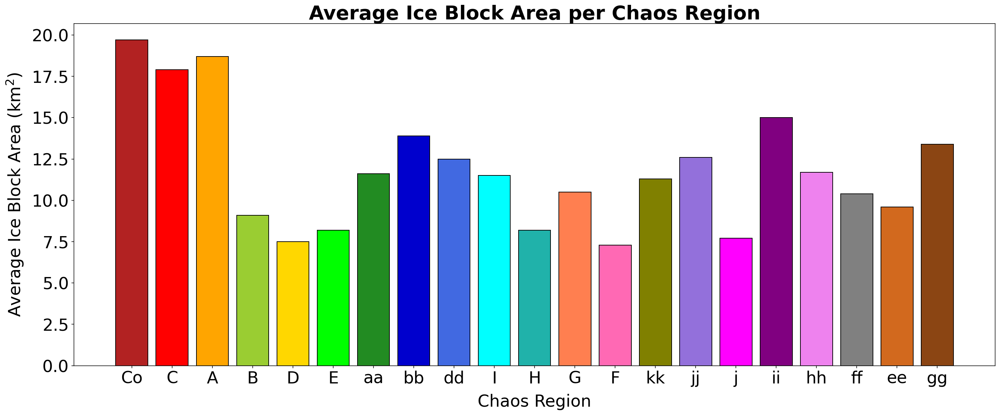

In [239]:
# average ice block area per region
fig = plt.figure(figsize=(20, 8))
x = [blocks_info.loc[blocks_info['Region'] == i, 'Area'] for i in regions]
y = [i.mean(axis=0).round(1) for i in x]
plt.bar(x=regions, height=y, label=regions, color=colors, ec='k')

plt.tight_layout()
plt.ylabel("Average Ice Block Area ($\mathregular{km^{2}}$)", labelpad=10, fontsize=24)
plt.xlabel("Chaos Region", labelpad=10, fontsize=24)
plt.xticks(rotation='horizontal', fontsize=24)
plt.yticks(fontsize=24)
plt.title("Average Ice Block Area per Chaos Region", fontweight = "bold", fontsize=28)
plt.savefig('plots/avg_block_area_per_chaos.png', bbox_inches='tight', dpi=300)
plt.show()